In [44]:
import re
from io import StringIO
from pathlib import Path

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import plotly.express as px
import plotly.graph_objects as go
import xgboost as xgb
from sklearn.metrics import root_mean_squared_error
from sklearn.model_selection import train_test_split
from statsmodels.tsa.stattools import adfuller, coint

file_path = Path("data/round-2-island-data-bottle")

Data Import


In [2]:
if file_path.exists():
    # Read the CSV file
    df_day_min_1 = pd.read_csv(
        file_path / "prices_round_2_day_-1.csv", delimiter=";"
    )  # day -1
    df_day_0 = pd.read_csv(
        file_path / "prices_round_2_day_0.csv", delimiter=";"
    )  # day 0
    df_day_plus_1 = pd.read_csv(
        file_path / "prices_round_2_day_1.csv", delimiter=";"
    )  # day 1
    print("File loaded successfully.")
else:
    print("File not found. Please ensure the file exists at:", file_path)

df_day_0["timestamp"] += 1000001  # edit timestamp
df_day_plus_1["timestamp"] += 2000002  # edit timestamp

df_day_min_1["DAY"] = "day_-1"
df_day_0["DAY"] = "day_0"
df_day_plus_1["DAY"] = "day_+1"

day_to_num = {"day_-1": -1, "day_0": 0, "day_+1": 1}
df = pd.concat([df_day_min_1, df_day_0, df_day_plus_1], ignore_index=True)

df["DAY_NUM"] = df["DAY"].map(day_to_num)
color_map = {"day_-1": "red", "day_0": "green", "day_+1": "blue"}
df["COLOR"] = df["DAY"].map(color_map)

print(df)

File loaded successfully.
       timestamp  ORCHIDS  TRANSPORT_FEES  EXPORT_TARIFF  IMPORT_TARIFF  \
0              0  1200.00             1.5           10.5           -2.0   
1            100  1201.75             1.5            9.5           -2.0   
2            200  1201.75             1.5            9.5           -2.0   
3            300  1201.75             1.5            9.5           -2.0   
4            400  1201.75             1.5            9.5           -2.0   
...          ...      ...             ...            ...            ...   
29998    2999602  1036.25             0.9            9.5           -5.0   
29999    2999702  1036.25             0.9            9.5           -5.0   
30000    2999802  1036.25             0.9            9.5           -5.0   
30001    2999902  1034.25             0.9            9.5           -5.0   
30002    3000002  1035.25             0.9            9.5           -5.0   

        SUNLIGHT  HUMIDITY     DAY  DAY_NUM COLOR  
0      2500.0000  79.

In [3]:
df[df["timestamp"] == 1000001]

,timestamp,ORCHIDS,TRANSPORT_FEES,EXPORT_TARIFF,IMPORT_TARIFF,SUNLIGHT,HUMIDITY,DAY,DAY_NUM,COLOR
10001,1000001,1111.75,1.5,10.5,-2.0,4500.0,95.0,day_0,0,green


In [4]:
# Create the figure with a secondary x-axis
fig = go.Figure()

# Add separate traces for each day to have separate legends
for day, group_df in df.groupby("DAY"):
    fig.add_trace(
        go.Scatter(
            x=group_df["timestamp"],
            y=group_df["ORCHIDS"],
            mode="markers",
            name=day,  # This will create separate legends
            marker=dict(color=group_df["COLOR"]),
        )
    )

# Set up the layout for the plot with two x-axes
fig.update_layout(
    xaxis=dict(title="Timestamp", domain=[0, 1]),  # This is the primary x-axis
    xaxis2=dict(
        title="Day",
        overlaying="x",
        side="top",
        domain=[0, 1],  # This will align with the primary x-axis
        tickvals=list(day_to_num.values()),  # Positional values for days
        ticktext=list(day_to_num.keys()),  # Text labels for days
        showgrid=False,  # Hide the gridlines for clarity
    ),
    yaxis=dict(title="Orchids Price"),
)

# Show the figure
fig.show()

In [5]:
# Plot using Plotly
fig = px.line(df, x="timestamp", y="ORCHIDS", title="Orchids Price Over Time")
fig.update_xaxes(title_text="Timestamp")
fig.update_yaxes(title_text="Orchids Price")
fig.show()

fig2 = px.line(df, x="timestamp", y="HUMIDITY", title="Humidity Levels Over Time")
fig2.update_xaxes(title_text="Timestamp")
fig2.update_yaxes(title_text="Humidity (%)")
fig2.show()

fig3 = px.line(df, x="timestamp", y="SUNLIGHT", title="SUNLIGHT Levels Over Time")
fig3.update_xaxes(title_text="Timestamp")
fig3.update_yaxes(title_text="Humidity (%)")
fig3.show()

In [6]:
fig = go.Figure()

# Add Orchids Price trace
fig.add_trace(
    go.Scatter(
        x=df["timestamp"],
        y=df["ORCHIDS"],
        mode="lines",
        name="Orchids Price",
        line=dict(color="blue"),  # Set the line color to blue for Orchids
        yaxis="y1",  # This trace uses the first y-axis
    )
)

# Add Humidity Levels trace
fig.add_trace(
    go.Scatter(
        x=df["timestamp"],
        y=df["HUMIDITY"],
        mode="lines",
        name="Humidity Levels",
        line=dict(color="red"),  # Set the line color to red for Humidity
        yaxis="y2",  # This trace uses the second y-axis
    )
)

# Add Sunlight Levels trace
fig.add_trace(
    go.Scatter(
        x=df["timestamp"],
        y=df["SUNLIGHT"],
        mode="lines",
        name="Sunlight Levels",
        line=dict(color="green"),  # Set the line color to green for Sunlight
        yaxis="y3",  # This trace uses the third y-axis
    )
)

# Update the layout to add titles and adjust other layout settings
fig.update_layout(
    title="Combined Data Visualization with Different Scales",
    xaxis_title="Timestamp",
    yaxis=dict(
        title="Orchids Price", titlefont=dict(color="blue"), tickfont=dict(color="blue")
    ),
    yaxis2=dict(
        title="Humidity (%)",
        titlefont=dict(color="red"),
        tickfont=dict(color="red"),
        overlaying="y",
        side="right",
        # position=0.94
    ),
    yaxis3=dict(
        title="Sunlight",
        titlefont=dict(color="green"),
        tickfont=dict(color="green"),
        overlaying="y",
        side="right",
        # position=0.98
    ),
    width=1200,  # width in pixels
    height=600,  # height in pixels
    legend=dict(
        x=1,  # x=1 means the right end of the legend aligns with the right end of the plot
        y=1.2,  # y=1 means the top of the legend aligns with the top of the plot
        # xanchor="auto",  # 'auto' adjusts the anchor to the text
        # yanchor="auto",  # 'auto' adjusts the anchor to the text
    ),
)

# Show the figure
fig.show()

In [7]:
df["COMBINED_X"] = df["DAY"].astype(str) + "-" + df["timestamp"].astype(str)

# Create the figure
fig = go.Figure()

# Add the ORCHIDS trace
fig.add_trace(
    go.Scatter(
        x=df["COMBINED_X"], y=df["ORCHIDS"], mode="lines+markers", name="ORCHIDS"
    )
)

# Add the HUMIDITY trace
fig.add_trace(
    go.Scatter(
        x=df["COMBINED_X"],
        y=df["HUMIDITY"],
        mode="lines+markers",
        name="HUMIDITY",
        yaxis="y2",
    )
)

# Update the layout to add a secondary y-axis for humidity
fig.update_layout(
    title="Orchids and Humidity Over Time by Day",
    xaxis_title="Day-Timestamp",
    yaxis_title="Orchids Price",
    yaxis2=dict(title="Humidity (%)", overlaying="y", side="right"),
)

In [8]:
# Create the figure
fig = go.Figure()

# Add the ORCHIDS trace
fig.add_trace(
    go.Scatter(
        x=df["COMBINED_X"], y=df["ORCHIDS"], mode="lines+markers", name="ORCHIDS"
    )
)

# Add the SUNLIGHT trace
fig.add_trace(
    go.Scatter(
        x=df["COMBINED_X"],
        y=df["SUNLIGHT"],
        mode="lines+markers",
        name="SUNLIGHT",
        yaxis="y2",
    )
)

# Update the layout to add a secondary y-axis for humidity
fig.update_layout(
    title="Orchids and SUNLIGHT Over Time by Day",
    xaxis_title="Day-Timestamp",
    yaxis_title="Orchids Price",
    yaxis2=dict(title="SUNLIGHT Level", overlaying="y", side="right"),
)

1. Checking Stationarity


In [9]:
# Perform Augmented Dickey-Fuller test
result = adfuller(df["timestamp"])
print("ADF Statistic:", result[0])
print("p-value:", result[1])
print("Critical Values:")
for key, value in result[4].items():
    print("\t%s: %.3f" % (key, value))

# Based on the p-value and comparing the ADF statistic to the critical values, determine stationarity
if result[1] < 0.05:
    print("The series is stationary.")
else:
    print("The series is not stationary.")

ADF Statistic: -8.082940114227746e-05
p-value: 0.9585254010146941
Critical Values:
	1%: -3.431
	5%: -2.862
	10%: -2.567
The series is not stationary.


2. Transforming Non-Stationary Data


In [10]:
# Differencing the series
diff_series = df["timestamp"].diff().dropna()  # First difference

# Check stationarity again
result = adfuller(diff_series)
print("ADF Statistic after differencing:", result[0])
print("p-value after differencing:", result[1])

ADF Statistic after differencing: -173.2137415642397
p-value after differencing: 0.0


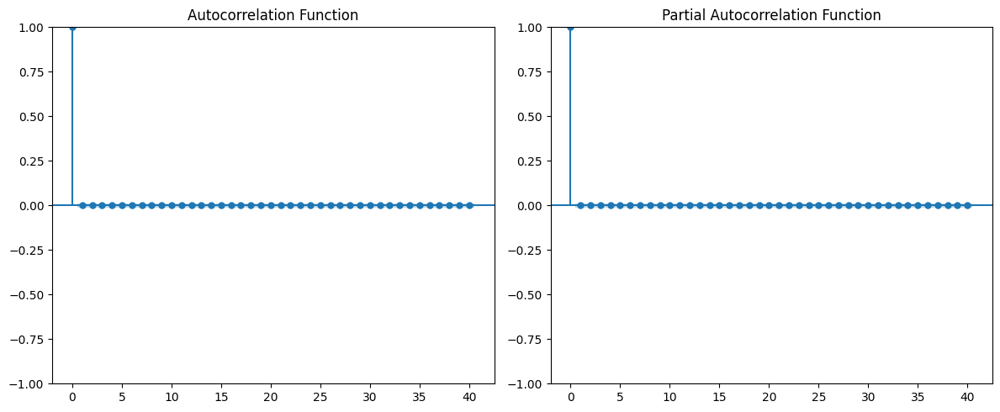

In [11]:
import matplotlib.pyplot as plt
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

# Plot ACF and PACF
plt.figure(figsize=(12, 5))
plt.subplot(121)
plot_acf(diff_series, ax=plt.gca(), lags=40)
plt.title("Autocorrelation Function")

plt.subplot(122)
plot_pacf(diff_series, ax=plt.gca(), lags=40)
plt.title("Partial Autocorrelation Function")
plt.tight_layout()
plt.show()

### XGBoost


In [12]:
bins = [0, 1_000_000, 2_000_000, 3_000_000]
labels = ["day_-1", "day_0", "day_+1"]

# Create a new 'day' column based on these bins
df["day"] = pd.cut(df["timestamp"], bins=bins, labels=labels, right=False)

# Check the first few rows to confirm the day column is correct
print(df.head())

   timestamp  ORCHIDS  TRANSPORT_FEES  EXPORT_TARIFF  IMPORT_TARIFF  \
0          0  1200.00             1.5           10.5           -2.0   
1        100  1201.75             1.5            9.5           -2.0   
2        200  1201.75             1.5            9.5           -2.0   
3        300  1201.75             1.5            9.5           -2.0   
4        400  1201.75             1.5            9.5           -2.0   

    SUNLIGHT  HUMIDITY     DAY  DAY_NUM COLOR  COMBINED_X     day  
0  2500.0000  79.00000  day_-1       -1   red    day_-1-0  day_-1  
1  2499.4197  79.00410  day_-1       -1   red  day_-1-100  day_-1  
2  2498.8457  79.00821  day_-1       -1   red  day_-1-200  day_-1  
3  2498.2780  79.01234  day_-1       -1   red  day_-1-300  day_-1  
4  2497.7166  79.01649  day_-1       -1   red  day_-1-400  day_-1  


Step 2: Incorporate the New Day Column into Your Model
After creating the day column, you might consider converting this categorical variable into a format suitable for modeling, such as one-hot encoding, especially if you plan to use it as a feature in your XGBoost model


In [13]:
# One-hot encoding the 'day' column
day_dummies = pd.get_dummies(df["day"], prefix="day")
df = pd.concat([df, day_dummies], axis=1)

In [22]:
df

,timestamp,ORCHIDS,TRANSPORT_FEES,EXPORT_TARIFF,IMPORT_TARIFF,SUNLIGHT,HUMIDITY,DAY,DAY_NUM,COLOR,COMBINED_X,day,day_day_-1,day_day_0,day_day_+1
0,0,1200.00,1.5,10.5,-2.0,2500.0000,79.000000,day_-1,-1,red,day_-1-0,day_-1,True,False,False
1,100,1201.75,1.5,9.5,-2.0,2499.4197,79.004100,day_-1,-1,red,day_-1-100,day_-1,True,False,False
2,200,1201.75,1.5,9.5,-2.0,2498.8457,79.008210,day_-1,-1,red,day_-1-200,day_-1,True,False,False
3,300,1201.75,1.5,9.5,-2.0,2498.2780,79.012340,day_-1,-1,red,day_-1-300,day_-1,True,False,False
4,400,1201.75,1.5,9.5,-2.0,2497.7166,79.016490,day_-1,-1,red,day_-1-400,day_-1,True,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19996,1999501,989.25,1.3,10.5,-2.6,1704.4551,64.986400,day_0,0,green,day_0-1999501,day_0,False,True,False
19997,1999601,988.25,1.3,10.5,-2.6,1703.5710,64.989100,day_0,0,green,day_0-1999601,day_0,False,True,False
19998,1999701,988.00,1.3,10.5,-2.6,1702.6835,64.991806,day_0,0,green,day_0-1999701,day_0,False,True,False
19999,1999801,988.75,1.3,10.5,-2.6,1701.7925,64.994530,day_0,0,green,day_0-1999801,day_0,False,True,False


Step 3: Proceed with Model Training


In [19]:
features = [
    "timestamp",
    "day_day_-1",
    "day_day_0",
    "day_day_+1",
    "TRANSPORT_FEES",
    "EXPORT_TARIFF",
    "IMPORT_TARIFF",
    "SUNLIGHT",
    "HUMIDITY",
]
target = "ORCHIDS"  # Replace with your actual target column name

# Split data into features and target
X = df[features]
y = df[target]

# Split data into train and test sets
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42
)

# Define and train the XGBoost model
model = xgb.XGBRegressor(
    objective="reg:squarederror", n_estimators=100, learning_rate=0.1
)
model.fit(X_train, y_train)

# Predict and evaluate the model
y_pred = model.predict(X_test)
rmse = root_mean_squared_error(y_test, y_pred)
print(f"Root Mean Squared Error: {rmse}")

Root Mean Squared Error: 2.981701723916905


In [16]:
import sklearn

print("scikit-learn version:", sklearn.__version__)

scikit-learn version: 1.4.2


## Convert your XGBoost model into if-else format

url: https://towardsdatascience.com/xgboost-deployment-made-easy-6e11f4b3f817


In [ ]:
train = pd.read_csv("data/train.csv")
test = pd.read_csv("data/test.csv")

In [24]:
train = df[(df["day"] == "day_-1") | (df["day"] == "day_0")]
test = df[df["day"] == "day_+1"]

print(len(train))
print(len(test))

20001
10001


In [25]:
train.columns

Index(['timestamp', 'ORCHIDS', 'TRANSPORT_FEES', 'EXPORT_TARIFF',
       'IMPORT_TARIFF', 'SUNLIGHT', 'HUMIDITY', 'DAY', 'DAY_NUM', 'COLOR',
       'COMBINED_X', 'day', 'day_day_-1', 'day_day_0', 'day_day_+1'],
      dtype='object')

In [58]:
df_train = df[df["timestamp"] <= 700000]
df_test = df[df["timestamp"] > 700000]

In [59]:
df_train

,timestamp,ORCHIDS,TRANSPORT_FEES,EXPORT_TARIFF,IMPORT_TARIFF,SUNLIGHT,HUMIDITY,DAY,DAY_NUM,COLOR,COMBINED_X,day,day_day_-1,day_day_0,day_day_+1
0,0,1200.00,1.5,10.5,-2.0,2500.0000,79.000000,day_-1,-1,red,day_-1-0,day_-1,True,False,False
1,100,1201.75,1.5,9.5,-2.0,2499.4197,79.004100,day_-1,-1,red,day_-1-100,day_-1,True,False,False
2,200,1201.75,1.5,9.5,-2.0,2498.8457,79.008210,day_-1,-1,red,day_-1-200,day_-1,True,False,False
3,300,1201.75,1.5,9.5,-2.0,2498.2780,79.012340,day_-1,-1,red,day_-1-300,day_-1,True,False,False
4,400,1201.75,1.5,9.5,-2.0,2497.7166,79.016490,day_-1,-1,red,day_-1-400,day_-1,True,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6996,699600,1149.75,1.5,10.5,-2.6,2899.7722,74.988270,day_-1,-1,red,day_-1-699600,day_-1,True,False,False
6997,699700,1148.75,1.5,10.5,-2.6,2899.8225,74.991120,day_-1,-1,red,day_-1-699700,day_-1,True,False,False
6998,699800,1149.75,1.5,10.5,-2.6,2899.8772,74.994026,day_-1,-1,red,day_-1-699800,day_-1,True,False,False
6999,699900,1149.75,1.5,10.5,-2.6,2899.9363,74.996990,day_-1,-1,red,day_-1-699900,day_-1,True,False,False


In [61]:
dtrain = xgb.DMatrix(data=df_train[["SUNLIGHT", "HUMIDITY"]], label=df_train["ORCHIDS"])
X_test = xgb.DMatrix(data=df_test[["SUNLIGHT", "HUMIDITY"]])

# Define parameters
params = {
    "base_score": np.mean(train["ORCHIDS"]),
    "max_depth": 3,
    "gamma": 3,
    "eta": 0.1,
    "objective": "reg:squarederror",
    "eval_metric": "mae",
}
num_rounds = 3

# Train the model
model = xgb.train(params=params, dtrain=dtrain, num_boost_round=num_rounds)

In [62]:
model.get_dump()

['0:[HUMIDITY<88.3680573] yes=1,no=2,missing=2\n\t1:[HUMIDITY<78.2046661] yes=3,no=4,missing=4\n\t\t3:[SUNLIGHT<3026.52051] yes=7,no=8,missing=8\n\t\t\t7:leaf=3.62106371\n\t\t\t8:leaf=5.50033808\n\t\t4:[SUNLIGHT<3266.39355] yes=9,no=10,missing=10\n\t\t\t9:leaf=8.07950878\n\t\t\t10:leaf=7.04799986\n\t2:[SUNLIGHT<4113.55762] yes=5,no=6,missing=6\n\t\t5:[SUNLIGHT<3666.51733] yes=11,no=12,missing=12\n\t\t\t11:leaf=8.39746952\n\t\t\t12:leaf=9.73084068\n\t\t6:[HUMIDITY<94.0856781] yes=13,no=14,missing=14\n\t\t\t13:leaf=12.1782608\n\t\t\t14:leaf=10.5517931\n',
 '0:[HUMIDITY<88.3680573] yes=1,no=2,missing=2\n\t1:[HUMIDITY<78.4797134] yes=3,no=4,missing=4\n\t\t3:[SUNLIGHT<3034.30249] yes=7,no=8,missing=8\n\t\t\t7:leaf=3.28497672\n\t\t\t8:leaf=5.02436399\n\t\t4:[HUMIDITY<85.9721146] yes=9,no=10,missing=10\n\t\t\t9:leaf=7.12607288\n\t\t\t10:leaf=6.15104771\n\t2:[SUNLIGHT<4113.55762] yes=5,no=6,missing=6\n\t\t5:[SUNLIGHT<3666.51733] yes=11,no=12,missing=12\n\t\t\t11:leaf=7.56090403\n\t\t\t12:leaf=

In [48]:
# model_dump = model.get_dump(dump_format="text")


# # Example function to convert dump to Python code (pseudo-code)
# def model_to_py(base_score, model_dump, outfile):
#     with open(outfile, "w") as f:
#         f.write("import numpy as np\n")
#         f.write("def xgb_model(input_vec):\n")
#         f.write(f"    base_score = {base_score}\n")
#         for tree in model_dump:
#             # Parse and convert tree to if-else statements here
#             pass

In [63]:
def string_parser(s):
    if len(re.findall(r":leaf=", s)) == 0:
        out = re.findall(r"[\w.-]+", s)
        tabs = re.findall(r"[\t]+", s)
        if out[4] == out[8]:
            missing_value_handling = " or np.isnan(x['" + out[1] + "']) "
        else:
            missing_value_handling = ""

        if len(tabs) > 0:
            return (
                re.findall(r"[\t]+", s)[0].replace("\t", "    ")
                + "        if state == "
                + out[0]
                + ":\n"
                + re.findall(r"[\t]+", s)[0].replace("\t", "    ")
                + "            state = ("
                + out[4]
                + " if "
                + "x['"
                + out[1]
                + "']<"
                + out[2]
                + missing_value_handling
                + " else "
                + out[6]
                + ")\n"
            )

        else:
            return (
                "        if state == "
                + out[0]
                + ":\n"
                + "            state = ("
                + out[4]
                + " if "
                + "x['"
                + out[1]
                + "']<"
                + out[2]
                + missing_value_handling
                + " else "
                + out[6]
                + ")\n"
            )
    else:
        out = re.findall(r"[\d.-]+", s)
        return (
            re.findall(r"[\t]+", s)[0].replace("\t", "    ")
            + "        if state == "
            + out[0]
            + ":\n    "
            + re.findall(r"[\t]+", s)[0].replace("\t", "    ")
            + "        return "
            + out[1]
            + "\n"
        )


def tree_parser(tree, i):
    if i == 0:
        return "    if num_booster == 0:\n        state = 0\n" + "".join(
            [
                string_parser(tree.split("\n")[i])
                for i in range(len(tree.split("\n")) - 1)
            ]
        )
    else:
        return (
            "    elif num_booster == "
            + str(i)
            + ":\n        state = 0\n"
            + "".join(
                [
                    string_parser(tree.split("\n")[i])
                    for i in range(len(tree.split("\n")) - 1)
                ]
            )
        )


def model_to_py(base_score, model, out_file):
    trees = model.get_dump()
    result = ["import numpy as np\n\n" + "def xgb_tree(x, num_booster):\n"]

    for i in range(len(trees)):
        result.append(tree_parser(trees[i], i))

    with open(out_file, "a") as the_file:
        the_file.write(
            "".join(result)
            + "\ndef xgb_predict(x):\n    predict = "
            + str(base_score)
            + "\n"
            + "# initialize prediction with base score\n"
            + "    for i in range("
            + str(len(trees))
            + "):\n        predict = predict + xgb_tree(x, i)"
            + "\n    return predict"
        )


model_to_py(params["base_score"], model, "xgb_model.py")

Step 3. Use the .py file to predict test data.


In [65]:
import xgb_model

y_test = model.predict(X_test)
test["pred"] = y_test
test[["SUNLIGHT", "HUMIDITY", "pred"]].iloc[10:].head(10)

ValueError: Length of values (23002) does not match length of index (10001)

In [67]:
len(y_test)

23002